# Customer df Prediction using XGBoost

## assumes Python3.11 or Python3.10 on cpu (rapids not pip installable for Python 3.11 yet)

Mobile phone services provides have historically had problems with high customer turnover.  Leaving a mobile phone operator is easy for an end customer, but as a mobile provider offering incentives to retain customers is often more cost effective/ more profitable than the cost of losing and reacquiring a customer later.  

This analysis demonstrates how to predict which customers may leave so that provider could offer timely incentives to retain their business.

In [1]:
# core imports
from hyperopt import fmin, hp, STATUS_OK, rand, tpe, Trials
from lazypredict.Supervised import LazyClassifier
import platform
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV, train_test_split
from xgboost import XGBClassifier
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import multiprocessing
import numpy as np
import pandas as pd

num_cores = multiprocessing.cpu_count()
num_cores
import timeit

# other analytics tools
import umap  # visualization

# jupyter formatting
%matplotlib inline
pd.options.display.width = 0
pd.options.display.max_columns = None

# read and describe data

In [2]:
# read tabular data from AWS customer df dataset
df = pd.read_csv(
    "s3://sagemaker-sample-files/datasets/tabular/synthetic/churn.txt", header=0
)
df.head(5)

,State,Account Length,Area Code,Phone,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
0,PA,163,806,403-2562,no,yes,300,8.16,3,7.58,3.93,4,6.51,4.07,100,5.11,4.93,6,5.67,3,True.
1,SC,15,836,158-8416,yes,no,0,10.02,4,4.23,2.33,0,9.97,7.14,200,6.44,3.22,6,2.56,8,False.
2,MO,131,777,896-6253,no,yes,300,4.71,3,4.77,4.54,3,4.57,5.36,100,5.14,7.14,2,6.25,4,False.
3,WY,75,878,817-5729,yes,yes,700,1.27,3,2.57,2.53,5,2.33,3.77,450,3.81,2.25,6,1.08,6,False.
4,WY,146,878,450-4942,yes,no,0,2.70,3,5.91,6.02,3,3.67,3.75,250,2.80,6.91,4,7.13,6,True.


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           5000 non-null   object 
 1   Account Length  5000 non-null   int64  
 2   Area Code       5000 non-null   int64  
 3   Phone           5000 non-null   object 
 4   Int'l Plan      5000 non-null   object 
 5   VMail Plan      5000 non-null   object 
 6   VMail Message   5000 non-null   int64  
 7   Day Mins        5000 non-null   float64
 8   Day Calls       5000 non-null   int64  
 9   Day Charge      5000 non-null   float64
 10  Eve Mins        5000 non-null   float64
 11  Eve Calls       5000 non-null   int64  
 12  Eve Charge      5000 non-null   float64
 13  Night Mins      5000 non-null   float64
 14  Night Calls     5000 non-null   int64  
 15  Night Charge    5000 non-null   float64
 16  Intl Mins       5000 non-null   float64
 17  Intl Calls      5000 non-null   i

In [4]:
df.describe()

,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
count,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00
mean,101.68,773.79,226.68,5.52,3.50,5.02,5.03,3.14,5.02,4.00,224.79,5.02,5.03,5.48,4.33,5.53
std,57.60,63.47,274.00,3.43,1.69,2.20,2.14,2.53,2.13,1.63,97.30,1.75,1.02,1.88,2.44,2.04
min,1.00,657.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.05,1.65,0.00,0.00,0.00
25%,52.00,736.00,0.00,2.68,2.00,3.47,3.59,1.00,3.53,2.92,150.00,3.87,4.35,4.00,2.47,4.00
50%,102.00,778.00,0.00,5.34,3.00,4.99,5.15,3.00,5.01,3.96,200.00,5.17,5.03,5.00,4.21,6.00
75%,151.00,806.00,400.00,7.94,5.00,6.56,6.55,5.00,6.49,5.10,300.00,6.27,5.72,7.00,5.96,7.00
max,200.00,878.00,1300.00,16.90,10.00,12.73,13.62,14.00,12.35,10.18,550.00,10.41,8.41,12.00,14.21,13.00


In [5]:
df["Phone"].nunique()

4999

# simple cleanup 

In [6]:
# phone is all unique values - not useful for this prediction excercise; drop the column
df = df.drop(labels=["Phone"], axis=1)

In [7]:
# churn has weird period in values
df["Churn?"] = df["Churn?"].str.replace(".", "").astype("string").replace({"True": "1", "False": "0"}).astype("int8")

# Int'l Plan and VMail Plan	are all no/yes values - convert to int for later correlation
df[["Int'l Plan", "VMail Plan"]] = df[["Int'l Plan", "VMail Plan"]].astype("str").replace({"no": 0, "yes": 1}).astype("int8")

# area code is numeric, but really should be treated like a category
df["Area Code"] = df["Area Code"].astype("string")

df.head(5)

,State,Account Length,Area Code,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
0,PA,163,806,0,1,300,8.16,3,7.58,3.93,4,6.51,4.07,100,5.11,4.93,6,5.67,3,1
1,SC,15,836,1,0,0,10.02,4,4.23,2.33,0,9.97,7.14,200,6.44,3.22,6,2.56,8,0
2,MO,131,777,0,1,300,4.71,3,4.77,4.54,3,4.57,5.36,100,5.14,7.14,2,6.25,4,0
3,WY,75,878,1,1,700,1.27,3,2.57,2.53,5,2.33,3.77,450,3.81,2.25,6,1.08,6,0
4,WY,146,878,1,0,0,2.70,3,5.91,6.02,3,3.67,3.75,250,2.80,6.91,4,7.13,6,1


In [8]:
df_obj_cols = df.select_dtypes("object").columns
df[df_obj_cols] = df[df_obj_cols].astype("string")

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           5000 non-null   string 
 1   Account Length  5000 non-null   int64  
 2   Area Code       5000 non-null   string 
 3   Int'l Plan      5000 non-null   int8   
 4   VMail Plan      5000 non-null   int8   
 5   VMail Message   5000 non-null   int64  
 6   Day Mins        5000 non-null   float64
 7   Day Calls       5000 non-null   int64  
 8   Day Charge      5000 non-null   float64
 9   Eve Mins        5000 non-null   float64
 10  Eve Calls       5000 non-null   int64  
 11  Eve Charge      5000 non-null   float64
 12  Night Mins      5000 non-null   float64
 13  Night Calls     5000 non-null   int64  
 14  Night Charge    5000 non-null   float64
 15  Intl Mins       5000 non-null   float64
 16  Intl Calls      5000 non-null   int64  
 17  Intl Charge     5000 non-null   f

## data observations
we converted Area Code to string, as it looks like a numeric feature column
converted object columns to strings
target variable is last column 'Churn?'

## profile data with ydata...

In [10]:
profile = ProfileReport(df, title="Customer df Data Profile")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

col_0,% observations
State,
AK,0.02
AL,0.02
AR,0.02
AZ,0.02
CA,0.02
CO,0.02
CT,0.02
DC,0.02
DE,0.02


col_0,% observations
Area Code,
657,0.04
658,0.02
659,0.02
676,0.02
677,0.02
678,0.02
686,0.04
707,0.02
716,0.02


,Account Length,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
count,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00,5000.00
mean,101.68,0.50,0.50,226.68,5.52,3.50,5.02,5.03,3.14,5.02,4.00,224.79,5.02,5.03,5.48,4.33,5.53,0.50
std,57.60,0.50,0.50,274.00,3.43,1.69,2.20,2.14,2.53,2.13,1.63,97.30,1.75,1.02,1.88,2.44,2.04,0.50
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.05,1.65,0.00,0.00,0.00,0.00
25%,52.00,0.00,0.00,0.00,2.68,2.00,3.47,3.59,1.00,3.53,2.92,150.00,3.87,4.35,4.00,2.47,4.00,0.00
50%,102.00,0.00,1.00,0.00,5.34,3.00,4.99,5.15,3.00,5.01,3.96,200.00,5.17,5.03,5.00,4.21,6.00,0.00
75%,151.00,1.00,1.00,400.00,7.94,5.00,6.56,6.55,5.00,6.49,5.10,300.00,6.27,5.72,7.00,5.96,7.00,1.00
max,200.00,1.00,1.00,1300.00,16.90,10.00,12.73,13.62,14.00,12.35,10.18,550.00,10.41,8.41,12.00,14.21,13.00,1.00


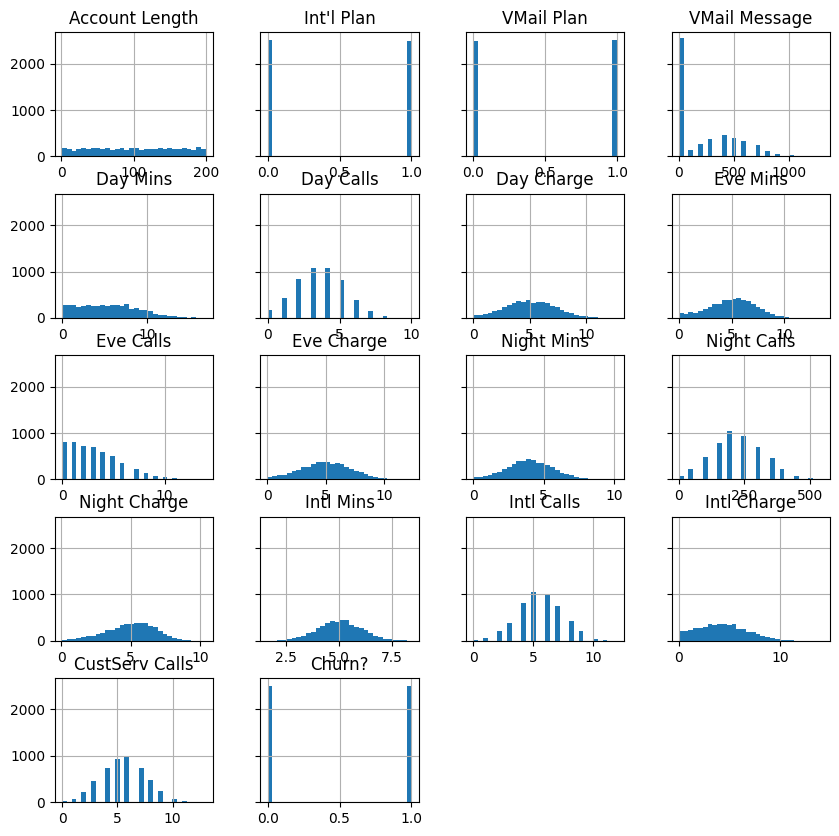

In [11]:
# some manual breakouts
# Frequency tables for each categorical feature
for column in df.select_dtypes(include=["string"]).columns:
    display(
        pd.crosstab(index=df[column], columns="% observations", normalize="columns")
    )

# Histograms for each numeric features
display(df.describe())

hist = df.hist(bins=30, sharey=True, figsize=(10, 10))

In [12]:
# data looks relatively evenly distributed
# note many VMail with zero messages

In [13]:
display(df.corr(method="pearson", numeric_only=True).style.background_gradient(cmap="Reds"))

,Account Length,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
Account Length,1.000000,-0.000304,-0.004436,-0.009030,-0.015878,0.011659,-0.007468,0.000213,0.026515,-0.012795,0.016400,-0.002383,-0.034925,0.017277,-0.003735,0.028285,-0.036721,0.004701
Int'l Plan,-0.000304,1.000000,0.002813,0.024655,-0.001491,-0.015633,-0.014795,-0.003894,-0.025029,0.014753,0.005968,-0.018712,-0.008108,-0.009190,-0.008775,0.027893,-0.007804,-0.002802
VMail Plan,-0.004436,0.002813,1.000000,0.823424,0.001120,0.005793,0.005936,-0.001191,-0.010087,0.002013,-0.002817,-0.001120,0.009168,-0.007376,0.007842,-0.014302,0.021791,-0.002396
VMail Message,-0.009030,0.024655,0.823424,1.000000,-0.143272,0.002762,-0.182712,-0.104667,-0.101240,-0.029212,0.061370,0.135042,-0.155475,-0.015162,0.131964,0.010120,0.068657,-0.187533
Day Mins,-0.015878,-0.001491,0.001120,-0.143272,1.000000,-0.087598,0.667941,0.482641,-0.184939,0.766489,0.188190,-0.445212,0.570508,0.001988,0.236131,0.239331,-0.195322,0.581856
Day Calls,0.011659,-0.015633,0.005793,0.002762,-0.087598,1.000000,-0.222556,0.033903,0.185881,-0.052051,-0.085222,-0.083050,0.046641,-0.022548,-0.045671,-0.120064,-0.065518,-0.002723
Day Charge,-0.007468,-0.014795,0.005936,-0.182712,0.667941,-0.222556,1.000000,0.574697,0.236626,0.371580,0.150700,-0.130722,0.374861,0.010294,0.119584,0.251748,-0.260945,0.435132
Eve Mins,0.000213,-0.003894,-0.001191,-0.104667,0.482641,0.033903,0.574697,1.000000,-0.067123,0.269980,-0.090515,0.067315,0.317481,-0.015678,0.070456,0.448910,-0.167347,0.430791
Eve Calls,0.026515,-0.025029,-0.010087,-0.101240,-0.184939,0.185881,0.236626,-0.067123,1.000000,-0.467814,0.221439,0.218149,-0.324936,-0.001593,-0.112062,0.017036,-0.433467,-0.217587
Eve Charge,-0.012795,0.014753,0.002013,-0.029212,0.766489,-0.052051,0.371580,0.269980,-0.467814,1.000000,0.184230,-0.454649,0.546137,-0.003569,0.164104,0.243936,-0.011019,0.459041


In [14]:
# realculate the correlation matrix for numeric columns only
corr_matrix = df.corr(numeric_only=True)

# Define high correlation threshold
threshold = 0.55


# Function to apply color if correlation is high
def color_high_corr(val):
    color = "orange" if abs(val) > threshold else "none"
    return f"background-color: {color}"


# Apply the coloring function to the DataFrame
python_dot_version = (int(platform.python_version().split(".")[1]))
if python_dot_version <= 10:
    styled_corr_matrix = corr_matrix.style.applymap(color_high_corr)   # using python <=3.10
else:
    styled_corr_matrix = corr_matrix.style.map(color_high_corr)        # for python 3.11+

# Display the styled DataFrame
display(styled_corr_matrix)

,Account Length,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
Account Length,1.000000,-0.000304,-0.004436,-0.009030,-0.015878,0.011659,-0.007468,0.000213,0.026515,-0.012795,0.016400,-0.002383,-0.034925,0.017277,-0.003735,0.028285,-0.036721,0.004701
Int'l Plan,-0.000304,1.000000,0.002813,0.024655,-0.001491,-0.015633,-0.014795,-0.003894,-0.025029,0.014753,0.005968,-0.018712,-0.008108,-0.009190,-0.008775,0.027893,-0.007804,-0.002802
VMail Plan,-0.004436,0.002813,1.000000,0.823424,0.001120,0.005793,0.005936,-0.001191,-0.010087,0.002013,-0.002817,-0.001120,0.009168,-0.007376,0.007842,-0.014302,0.021791,-0.002396
VMail Message,-0.009030,0.024655,0.823424,1.000000,-0.143272,0.002762,-0.182712,-0.104667,-0.101240,-0.029212,0.061370,0.135042,-0.155475,-0.015162,0.131964,0.010120,0.068657,-0.187533
Day Mins,-0.015878,-0.001491,0.001120,-0.143272,1.000000,-0.087598,0.667941,0.482641,-0.184939,0.766489,0.188190,-0.445212,0.570508,0.001988,0.236131,0.239331,-0.195322,0.581856
Day Calls,0.011659,-0.015633,0.005793,0.002762,-0.087598,1.000000,-0.222556,0.033903,0.185881,-0.052051,-0.085222,-0.083050,0.046641,-0.022548,-0.045671,-0.120064,-0.065518,-0.002723
Day Charge,-0.007468,-0.014795,0.005936,-0.182712,0.667941,-0.222556,1.000000,0.574697,0.236626,0.371580,0.150700,-0.130722,0.374861,0.010294,0.119584,0.251748,-0.260945,0.435132
Eve Mins,0.000213,-0.003894,-0.001191,-0.104667,0.482641,0.033903,0.574697,1.000000,-0.067123,0.269980,-0.090515,0.067315,0.317481,-0.015678,0.070456,0.448910,-0.167347,0.430791
Eve Calls,0.026515,-0.025029,-0.010087,-0.101240,-0.184939,0.185881,0.236626,-0.067123,1.000000,-0.467814,0.221439,0.218149,-0.324936,-0.001593,-0.112062,0.017036,-0.433467,-0.217587
Eve Charge,-0.012795,0.014753,0.002013,-0.029212,0.766489,-0.052051,0.371580,0.269980,-0.467814,1.000000,0.184230,-0.454649,0.546137,-0.003569,0.164104,0.243936,-0.011019,0.459041


In [15]:
# looks like there are high correlation between the "Day Charge" "Eve Charge" and "Night Charge" columns vs. Day Mins -- so let's drop the Charge columns, since they will be some scalar value * some num of minutes

df = df.drop(labels=["Day Charge", "Eve Charge", "Night Charge", "VMail Plan"], axis=1)

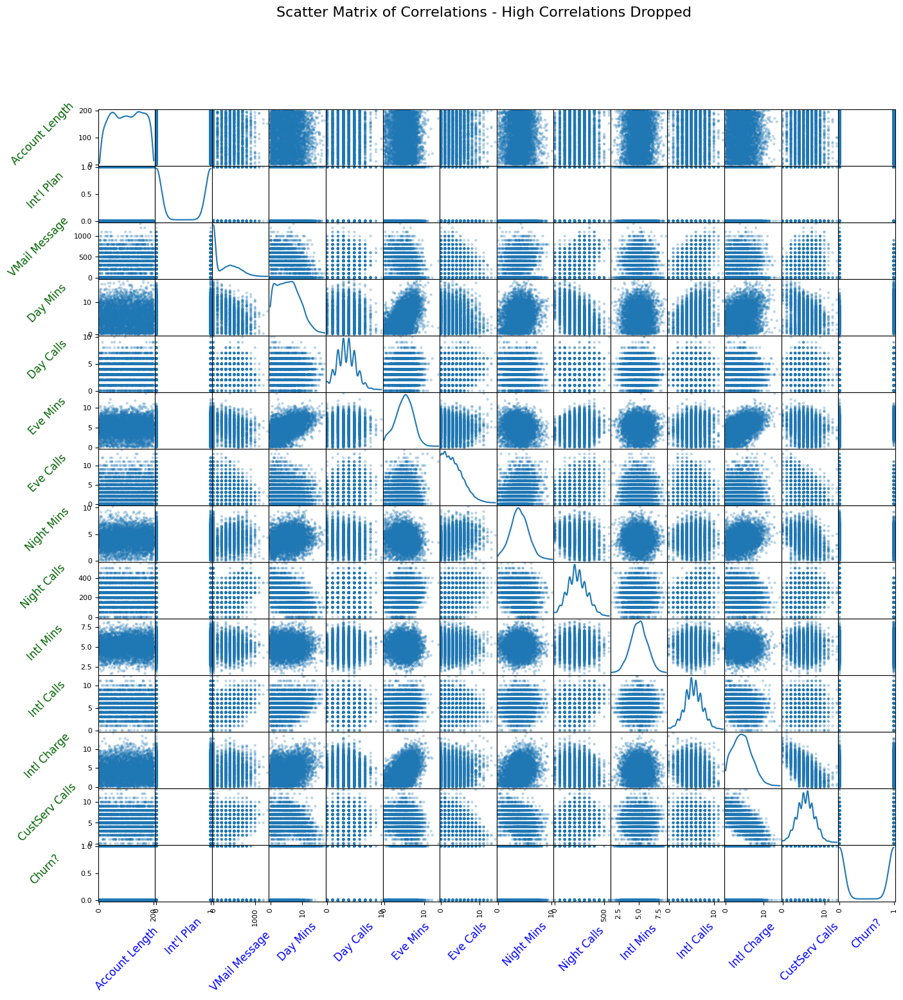

In [16]:
scatter_matrix_fig = pd.plotting.scatter_matrix(df, figsize=(16, 16), alpha=0.3, diagonal='kde', grid=True)

# fix label rotation for readability
for ax in scatter_matrix_fig.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize=12, rotation=45)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12, rotation=45, labelpad=35)
    ax.xaxis.label.set_color("blue")  # Set x axis labels to blue
    ax.yaxis.label.set_color("darkgreen")  # Set y axis labels to green
    ax.set_facecolor("white")

plt.suptitle("Scatter Matrix of Correlations - High Correlations Dropped", fontsize=16)
plt.show()

# Start modeling

In [17]:
# get dummy values for category/string columns
model_data = pd.get_dummies(df)
model_data.head(5)

,Account Length,Int'l Plan,VMail Message,Day Mins,Day Calls,Eve Mins,Eve Calls,Night Mins,Night Calls,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?,State_AK,State_AL,State_AR,State_AZ,State_CA,State_CO,State_CT,State_DC,State_DE,State_FL,State_GA,State_HI,State_IA,State_ID,State_IL,State_IN,State_KS,State_KY,State_LA,State_MA,State_MD,State_ME,State_MI,State_MN,State_MO,State_MS,State_MT,State_NC,State_ND,State_NE,State_NH,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY,Area Code_657,Area Code_658,Area Code_659,Area Code_676,Area Code_677,Area Code_678,Area Code_686,Area Code_707,Area Code_716,Area Code_727,Area Code_736,Area Code_737,Area Code_758,Area Code_766,Area Code_776,Area Code_777,Area Code_778,Area Code_786,Area Code_787,Area Code_788,Area Code_797,Area Code_798,Area Code_806,Area Code_827,Area Code_836,Area Code_847,Area Code_848,Area Code_858,Area Code_866,Area Code_868,Area Code_876,Area Code_877,Area Code_878
0,163,0,300,8.16,3,3.93,4,4.07,100,4.93,6,5.67,3,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
1,15,1,0,10.02,4,2.33,0,7.14,200,3.22,6,2.56,8,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
2,131,0,300,4.71,3,4.54,3,5.36,100,7.14,2,6.25,4,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,75,1,700,1.27,3,2.53,5,3.77,450,2.25,6,1.08,6,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
4,146,1,0,2.70,3,6.02,3,3.75,250,6.91,4,7.13,6,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


In [18]:
churn_col = model_data.pop("Churn?") 
model_data.insert(0, "Churn?", churn_col)
model_data.head(5)

,Churn?,Account Length,Int'l Plan,VMail Message,Day Mins,Day Calls,Eve Mins,Eve Calls,Night Mins,Night Calls,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,State_AK,State_AL,State_AR,State_AZ,State_CA,State_CO,State_CT,State_DC,State_DE,State_FL,State_GA,State_HI,State_IA,State_ID,State_IL,State_IN,State_KS,State_KY,State_LA,State_MA,State_MD,State_ME,State_MI,State_MN,State_MO,State_MS,State_MT,State_NC,State_ND,State_NE,State_NH,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY,Area Code_657,Area Code_658,Area Code_659,Area Code_676,Area Code_677,Area Code_678,Area Code_686,Area Code_707,Area Code_716,Area Code_727,Area Code_736,Area Code_737,Area Code_758,Area Code_766,Area Code_776,Area Code_777,Area Code_778,Area Code_786,Area Code_787,Area Code_788,Area Code_797,Area Code_798,Area Code_806,Area Code_827,Area Code_836,Area Code_847,Area Code_848,Area Code_858,Area Code_866,Area Code_868,Area Code_876,Area Code_877,Area Code_878
0,1,163,0,300,8.16,3,3.93,4,4.07,100,4.93,6,5.67,3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
1,0,15,1,0,10.02,4,2.33,0,7.14,200,3.22,6,2.56,8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
2,0,131,0,300,4.71,3,4.54,3,5.36,100,7.14,2,6.25,4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,0,75,1,700,1.27,3,2.53,5,3.77,450,2.25,6,1.08,6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
4,1,146,1,0,2.70,3,6.02,3,3.75,250,6.91,4,7.13,6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


In [19]:
train_data, validation_data, test_data = np.split(
    model_data.sample(frac=1, random_state=1729),
    [int(0.7 * len(model_data)), int(0.9 * len(model_data))],
)

train_data.to_csv("./data/train.csv", header=False, index=False)
validation_data.to_csv("./data/validation.csv", header=False, index=False)

In [20]:
# Umap visualization
# Create the mapper
mapper = umap.UMAP()

embedding = mapper.fit_transform(train_data)

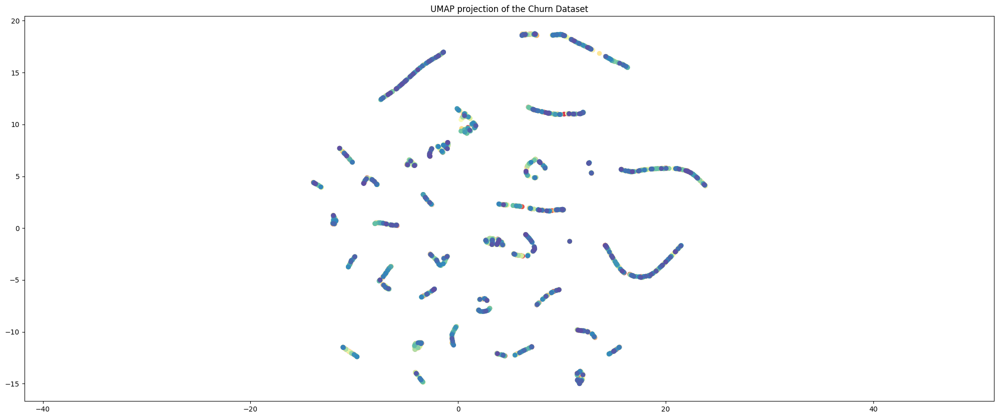

In [21]:
# scatter plot with a colormap
plt.figure(figsize=(25, 10))
plt.gca().set_aspect("equal", "datalim")
plt.title("UMAP projection of the Churn Dataset", fontsize=12)

# The third argument can be any array of the same length as the embedding data
plt.scatter(embedding[:, 0], embedding[:, 1], c=range(len(embedding)), cmap="Spectral")
plt.show()

In [22]:
# interesting, the data has clear clusters -- some are long ranges / curves -- long mostly purple/green lines
# and there are also some very tight clusers
# also single outliers - dark purple dots alone

# Lazypredict - let's see what the quick and dirty results look like

In [23]:
# using lazypredict lib
# link to our project data -- be sure to use `model_data` that has been converted to numeric, not the original df
X = model_data.drop(["Churn?"], axis=1)
Y = model_data[
    "Churn?"
]  # this column contains our targets - did the user churn or not

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

clf_lazy = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
clf_models, clf_predictions = clf_lazy.fit(X_train, X_test, y_train, y_test)

clf_models

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:04<00:00,  5.97it/s]

[LightGBM] [Info] Number of positive: 1993, number of negative: 2007
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1563
[LightGBM] [Info] Number of data points in the train set: 4000, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498250 -> initscore=-0.007000
[LightGBM] [Info] Start training from score -0.007000


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
QuadraticDiscriminantAnalysis,0.95,0.95,0.95,0.95,0.03
LGBMClassifier,0.95,0.95,0.95,0.95,0.12
XGBClassifier,0.95,0.95,0.95,0.95,0.52
SVC,0.95,0.95,0.95,0.95,0.23
RandomForestClassifier,0.94,0.94,0.94,0.94,0.60
ExtraTreesClassifier,0.94,0.94,0.94,0.94,0.31
KNeighborsClassifier,0.93,0.93,0.93,0.93,0.12
NuSVC,0.93,0.92,0.92,0.92,0.47
BaggingClassifier,0.92,0.92,0.92,0.91,0.20


In [24]:
# looks like we should be able to hit ~0.95 with XGBoost; a couple points higher without Area Code one-hot and Int'l + VMail Plan features

In [25]:
# if GPU working use device= 'cuda', else run on CPU
xgb_clf = XGBClassifier(
    device="cpu", colsample_bytree=0.6, subsample=0.7, random_state=42, seed=2
)
xgb_clf.fit(X_train, y_train.astype(int))

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [26]:
xgb_clf.score(X_test, y_test.astype(int))

0.944

In [27]:
# OKAY - 94% on first pass, let's try some hyperparameter optimization to get above 93

In [28]:
# Define the parameter grid
param_grid = {
    "colsample_bytree": [0.6, 0.7, 0.8],
    "learning_rate": [0.01, 0.05, 0.1],
    "max_depth": [3, 5, 10, 15],
    "n_estimators": [100, 200, 300],
    "subsample": [0.7, 0.8, 0.9],
}

# Create the classifier
# to run on GPU, set device= "cuda" - rapids / cudf required to move data to gpu to avoid mismatch device for data/calculation warning
xgb_clf = XGBClassifier(random_state=42, device="cpu")

# Create the GridSearchCV object
grid_search = GridSearchCV(
    estimator=xgb_clf, param_grid=param_grid, scoring="accuracy", cv=5, n_jobs=-1
)  # cv=num of cross val folds; n_jobs=-1 uses all cpu cores; device= "cuda" to run on gpu

# Fit the grid search to the data
grid_search.fit(
    X_train, y_train.astype(int)
)  # .astype(int) correctly infers bool target col dtype

# best parameters we found
print("Best parameters found: ", grid_search.best_params_)

Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 300, 'subsample': 0.9}


In [29]:
# grid search cross validation instantiation
# run on GPU with device= "cuda"
xgb_clf = XGBClassifier(
    device="cpu",
    random_state=42,
    seed=2,  # last static value
    colsample_bytree=grid_search.best_params_["colsample_bytree"],
    learning_rate=grid_search.best_params_["learning_rate"],
    max_depth=grid_search.best_params_["max_depth"],
    n_estimators=grid_search.best_params_["n_estimators"],
    subsample=grid_search.best_params_["subsample"],
)
xgb_clf.fit(X_train, y_train.astype(int))
xgb_clf.score(X_test, y_test.astype(int))

0.949

In [30]:
# manual check - human provided params
# run on GPU with device= "cuda"
xgb_clf = XGBClassifier(
    device="cpu",
    random_state=42,
    seed=2,  # last static value
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=15,
    n_estimators=300,
    subsample=0.8,
)
xgb_clf.fit(X_train, y_train.astype(int))
xgb_clf.score(X_test, y_test.astype(int))

0.948

In [31]:
# not quite at 95% - what else can we do?
# explore some optimization libraries; first check out features that drive classification results

# look at SHAP explanation of the model features

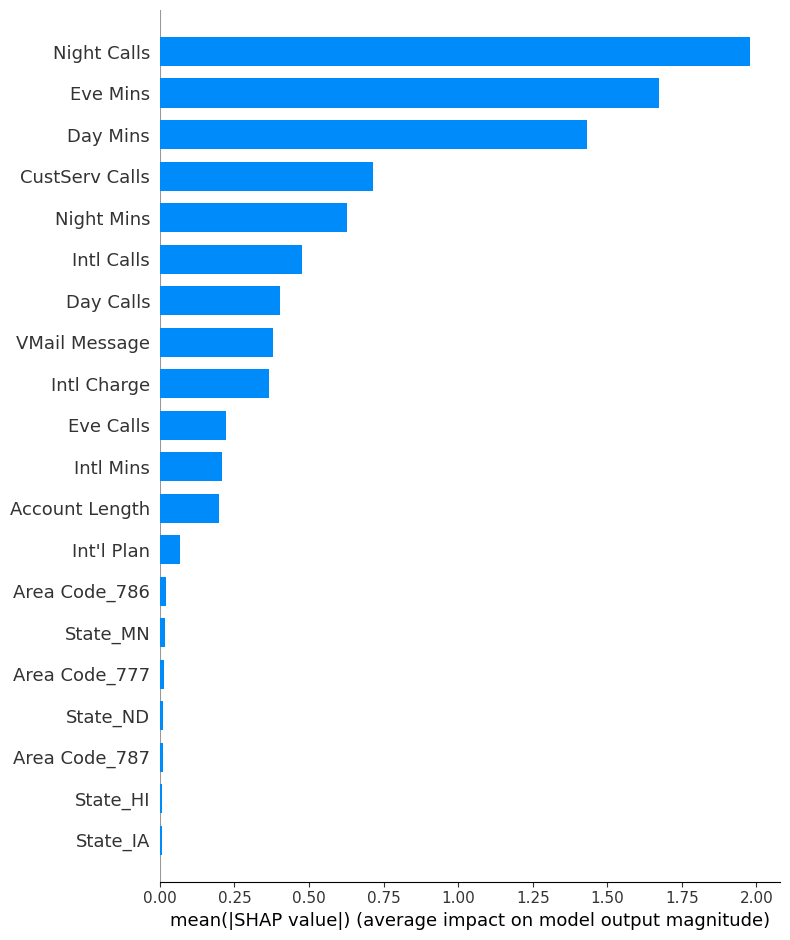

In [32]:
# Create a SHAP explainer using the XGBoost model from above
import shap

explainer = shap.Explainer(xgb_clf)

# Compute SHAP values for the training set
shap_values = explainer.shap_values(X_train)

# Generate a summary plot
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [33]:
# features that seem to drive the most turnover are # of calls in night and number of minutes in the evening -- which may imply the users with high turnover are price sensitive, making calls when rates are lower

# hyperparm optimization - using hyperopt library

In [34]:
# define search space -- key parameters and ranges
space = {
    "device":"cpu",     # run on cpu
    "random_state":42,  # make list so gridsearch combos work on iterable
    "seed": 2,          # last static value
    "colsample_bytree": hp.uniform("colsample_bytree", 0.5, 1),
    "gamma": hp.uniform("gamma", 1, 9),
    "learning_rate": hp.uniform("learning_rate", 0.01, .1),
    "max_depth": hp.quniform("max_depth", 3, 15, 2),    
    "min_child_weight": hp.quniform("min_child_weight", 0, 10, 1),
    "n_estimators": hp.randint('n_estimators', 100, 400),
    "reg_alpha": hp.quniform("reg_alpha", 40, 180, 1),
    "reg_lambda": hp.uniform("reg_lambda", 0, 1),
    "subsample": hp.uniform("subsample", 0.5, 1)
}

In [35]:
# define function to feed parameters from search space into classifier, and log output


def objective(space):
    clf_search = XGBClassifier(
        device=space["device"],        # to run on gpu
        random_state = space["random_state"],
        seed= space["seed"],        # last static value, should match first run
        colsample_bytree=int(space["colsample_bytree"]),
        gamma=space["gamma"],
        max_depth=int(space["max_depth"]),
        min_child_weight=int(space["min_child_weight"]),
        n_estimators=space["n_estimators"],        
        reg_alpha=int(space["reg_alpha"]),
        reg_lambda= space["reg_lambda"],
        subsample_bytree=int(space["subsample"]),
    )

    evaluation = [(X_train, y_train.astype(int)), (X_test, y_test.astype(int))]

    clf_search.fit(
        X_train,
        y_train,
        eval_set=evaluation,
        eval_metric="auc",
        early_stopping_rounds=10,
        verbose=False,
    )

    pred = clf_search.predict(X_test)
    accuracy = accuracy_score(y_test, pred > 0.5)
    # print(f"Score: {accuracy}")
    return {"loss": -accuracy, "status": STATUS_OK}

In [36]:
trials = Trials()

best_hyperparams = fmin(
    fn=objective, space=space, algo=tpe.suggest, max_evals=500, trials=trials
)   # algo could be rand.suggest or tpe.suggest
best_hyperparams

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:48<00:00,  4.60trial/s, best loss: -0.795]


{'colsample_bytree': 0.8616512678295372,
 'gamma': 8.52420682039396,
 'learning_rate': 0.02147684667399262,
 'max_depth': 8.0,
 'min_child_weight': 5.0,
 'n_estimators': 116,
 'reg_alpha': 41.0,
 'reg_lambda': 0.1948959799308967,
 'subsample': 0.5659826131504452}

In [37]:
# use best_parameters to retest model; some params like gpu are not in fmin output, so get them from spaces dict
xgb_clf = XGBClassifier(
        device=space["device"],    # to run on gpu
        random_state = space["random_state"],
        seed= space["seed"],        # last static value, should match first run
        colsample_bytree=int(best_hyperparams["colsample_bytree"]),
        gamma=best_hyperparams["gamma"],
        learning_rate=best_hyperparams["learning_rate"],
        max_depth=int(best_hyperparams["max_depth"]),
        min_child_weight=int(best_hyperparams["min_child_weight"]),
        n_estimators=best_hyperparams["n_estimators"],        
        reg_alpha=int(best_hyperparams["reg_alpha"]),
        reg_lambda= best_hyperparams["reg_lambda"],
        subsample_bytree=int(best_hyperparams["subsample"]),
)

xgb_clf.fit(X_train, y_train.astype(int))
xgb_clf.score(X_test, y_test.astype(int))

0.819

In [38]:
# this result is not as good, notebook iterations on search space is not the same - let's try a broader gridsearch

In [39]:
# helper function to build gridsearch
from collections.abc import Iterable 

def estimate_gridsearch_time(
    model, param_grid: dict, cv: int = 5, processors: int = num_cores
):
    """estimates total time to run gridsearch given model and parameter grid
    runs model one time, and scales estimated time linearly based on number of combinations of param_grid
    """

    times = []
    for _ in range(5):
        start = timeit.default_timer()
        model.fit(X_train, y_train)
        model.score(X_train, y_train)
        times.append(timeit.default_timer() - start)

    single_train_time = 8  # np.array(times).mean() # seconds

    combos = 1
    for vals in param_grid.values():
        if isinstance(vals, Iterable):
            combos *= len(vals)

    num_models = combos * cv / processors
    seconds = num_models * single_train_time
    minutes = seconds / 60
    hours = minutes / 60
    days = hours / 24
    weeks = days / 7

    if minutes <= 60:
        print(f"estimated runtime: {minutes: >3.0f} minutes")
    elif hours <= 24:
        print(f"estimated runtime: {hours: >3.1f} hours")
    elif days <= 7:
        print(f"estimated runtime: {days: >3.1f} days")
    else:
        print(f"estimated runtime: {days: >3.1f} days, or {weeks: >3.1f} weeks")

In [40]:
# Define initial the parameter grid

# sadly cudf not yet available for pip install, and building on cuda would be a lot of rework
# this will give warnings
param_grid = {
    # "device":"cpu",    # cuda to run on gpu - slower if data not moved to gpu via cudf, else cpu
    # "random_state":42,
    # "seed": 2,          # last static value
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9],
    "learning_rate": [0.01, 0.05, 0.1, 0.2, 0.4],
    "max_depth": [3, 4, 5, 10, 15],
    "n_estimators": [100, 200, 300],
    "subsample": [0.7, 0.75, 0.8, 0.85, 0.9]
}

In [41]:
# check estimated runtime here / iterate on params to fit time available
estimate_gridsearch_time(xgb_clf, param_grid=param_grid, cv=5, processors=num_cores)

estimated runtime: 2.1 hours


In [42]:
# Create the classifier
xgb_clf = XGBClassifier(random_state=42)

# Create the GridSearchCV object
grid_search = GridSearchCV(
    estimator=xgb_clf, param_grid=param_grid, scoring="accuracy", cv=5, n_jobs=-1
)  # cv=num of cross val folds; n_jobs=-1 uses all cpu cores

# Fit the grid search to the data
grid_search.fit(
    X_train, y_train.astype(int)
)  # .astype(int) correctly infers bool target col dtype

# Print best parameters found
print("Best parameters found: ", grid_search.best_params_)

Best parameters found:  {'colsample_bytree': 0.9, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.85}


In [43]:
grid_search.best_params_

{'colsample_bytree': 0.9,
 'learning_rate': 0.05,
 'max_depth': 5,
 'n_estimators': 200,
 'subsample': 0.85}

In [44]:
# grid search cross validation instantiation
xgb_clf = XGBClassifier(
    random_state=42,
    seed=2,
    colsample_bytree=0.9,
    subsample=0.7,
    n_estimators=200,
    max_depth=15,
    learning_rate=0.05,
    device="cuda",
)
xgb_clf.fit(X_train, y_train.astype(int))
xgb_clf.score(X_test, y_test.astype(int))

0.952

In [45]:
# only marginally better than original goal, and just .002 less than our best gridsearch result